In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("karanwxlia/underwater-trash-detection")

print("Path to dataset files:", path)

100%|██████████| 213M/213M [00:10<00:00, 21.1MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1


In [2]:
import os

dataset_path = "/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1"
print(os.listdir(dataset_path))

['utd2.v8i.yolov8', 'utd2.v8i.tensorflow', 'utd2.v8i.coco']


In [3]:
yolo_path = os.path.join(dataset_path, "utd2.v8i.yolov8")
print(os.listdir(yolo_path))

['test', 'train', 'README.dataset.txt', 'valid', 'README.roboflow.txt', 'data.yaml']


In [4]:
import os
import shutil
import glob

# Define paths
all_images_path = "/kaggle/working/all_images"
all_labels_path = "/kaggle/working/all_labels"
os.makedirs(all_images_path, exist_ok=True)
os.makedirs(all_labels_path, exist_ok=True)

# Move images and labels from train, valid, and test to all_images & all_labels
for split in ["train", "valid", "test"]:
    split_images = os.path.join(yolo_path, split, "images")
    split_labels = os.path.join(yolo_path, split, "labels")

    for img in glob.glob(os.path.join(split_images, "*.jpg")):
        shutil.move(img, all_images_path)

    for lbl in glob.glob(os.path.join(split_labels, "*.txt")):
        shutil.move(lbl, all_labels_path)

print("Merged all images and labels into `all_images/` and `all_labels/`.")


Merged all images and labels into `all_images/` and `all_labels/`.


In [5]:

import random
all_images = sorted(glob.glob(os.path.join(all_images_path, "*.jpg")))
random.shuffle(all_images)

# Define split
split_idx = int(0.7 * len(all_images))
train_images, test_images = all_images[:split_idx], all_images[split_idx:]

# Create new train/test folders
train_path = "/kaggle/working/train"
test_path = "/kaggle/working/test"
os.makedirs(os.path.join(train_path, "images"), exist_ok=True)
os.makedirs(os.path.join(test_path, "images"), exist_ok=True)
os.makedirs(os.path.join(train_path, "labels"), exist_ok=True)
os.makedirs(os.path.join(test_path, "labels"), exist_ok=True)

# Move images & labels
for img in train_images:
    shutil.move(img, os.path.join(train_path, "images"))
    lbl = img.replace("all_images", "all_labels").replace(".jpg", ".txt")
    if os.path.exists(lbl):
        shutil.move(lbl, os.path.join(train_path, "labels"))

for img in test_images:
    shutil.move(img, os.path.join(test_path, "images"))
    lbl = img.replace("all_images", "all_labels").replace(".jpg", ".txt")
    if os.path.exists(lbl):
        shutil.move(lbl, os.path.join(test_path, "labels"))

print(f"Train: {len(train_images)} images, Test: {len(test_images)} images")

Train: 6703 images, Test: 2873 images


In [6]:
yaml_path = os.path.join(yolo_path, "data.yaml")

# Read original yaml
with open(yaml_path, "r") as f:
    yaml_data = f.read()

# Modify paths
yaml_data = yaml_data.replace("train: train", f"train: {train_path}")
yaml_data = yaml_data.replace("test: test", f"test: {test_path}")

# Save updated yaml
with open("/kaggle/working/data.yaml", "w") as f:
    f.write(yaml_data)

print("Updated `data.yaml` for new dataset split!")

Updated `data.yaml` for new dataset split!


In [7]:
print("Train images:", len(os.listdir(os.path.join(train_path, "images"))))
print("Test images:", len(os.listdir(os.path.join(test_path, "images"))))

Train images: 6703
Test images: 2873


In [8]:
! pip install ultralytics opencv-python matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 46.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 71.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 52.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [20]:
from ultralytics import YOLO

model = YOLO("yolov10n.pt")
model.train(data="/content/data.yml", epochs=50, imgsz=640)

Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov10n.pt, data=/content/data.yml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, 

train: Scanning /kaggle/working/train/labels.cache... 6703 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6703/6703 [00:00<?, ?it/s]

train: WARNING ⚠️ /kaggle/working/train/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/test/labels.cache... 2873 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2873/2873 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.85G      2.855      7.662      3.159         53        640: 100%|██████████| 419/419 [02:27<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.72it/s]


                   all       2873       4155      0.303      0.151      0.111     0.0519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.06G      3.174      5.244      3.336         49        640: 100%|██████████| 419/419 [02:20<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.71it/s]


                   all       2873       4155        0.3       0.31      0.214     0.0998

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.06G      3.207       4.71      3.365         49        640: 100%|██████████| 419/419 [02:20<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.72it/s]


                   all       2873       4155      0.361      0.301      0.229     0.0991

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.06G      3.161      4.454      3.328         32        640: 100%|██████████| 419/419 [02:18<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.68it/s]

                   all       2873       4155      0.408      0.362      0.317      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.06G       3.09      4.186       3.24         48        640: 100%|██████████| 419/419 [02:20<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.70it/s]


                   all       2873       4155      0.437      0.405      0.374      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.06G      3.001      3.969      3.185         36        640: 100%|██████████| 419/419 [02:20<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.63it/s]

                   all       2873       4155      0.473       0.44      0.416      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.06G      2.953      3.773      3.139         50        640: 100%|██████████| 419/419 [02:17<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.70it/s]

                   all       2873       4155      0.611      0.507      0.555      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.06G       2.89      3.606      3.104         46        640: 100%|██████████| 419/419 [02:22<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.62it/s]

                   all       2873       4155      0.616      0.515      0.567      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.06G      2.893      3.534        3.1         52        640: 100%|██████████| 419/419 [02:23<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.57it/s]

                   all       2873       4155      0.611      0.513      0.567      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.06G      2.829      3.376      3.052         40        640: 100%|██████████| 419/419 [02:21<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.40it/s]

                   all       2873       4155       0.66       0.53      0.603      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.06G      2.827       3.33      3.041         39        640: 100%|██████████| 419/419 [02:35<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.37it/s]

                   all       2873       4155      0.592      0.461      0.513      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.06G      2.794      3.242      3.019         35        640: 100%|██████████| 419/419 [02:35<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.41it/s]

                   all       2873       4155      0.687      0.578      0.638      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.06G      2.763      3.144       3.01         49        640: 100%|██████████| 419/419 [02:37<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.37it/s]

                   all       2873       4155      0.689       0.56      0.636      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.06G      2.709      3.007      2.952         34        640: 100%|██████████| 419/419 [02:25<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.67it/s]

                   all       2873       4155      0.692      0.585      0.665      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.06G      2.721      2.992      2.951         49        640: 100%|██████████| 419/419 [02:24<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.55it/s]

                   all       2873       4155      0.732      0.639      0.718      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.06G      2.681      2.938      2.929         32        640: 100%|██████████| 419/419 [02:32<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.58it/s]

                   all       2873       4155      0.748      0.662      0.735      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.06G      2.643      2.838      2.911         34        640: 100%|██████████| 419/419 [02:29<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:27<00:00,  3.25it/s]

                   all       2873       4155      0.761      0.658      0.736       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.06G      2.647       2.78      2.913         24        640: 100%|██████████| 419/419 [02:33<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.41it/s]

                   all       2873       4155      0.764      0.671      0.755      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.06G      2.643      2.786      2.909         32        640: 100%|██████████| 419/419 [02:32<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.71it/s]

                   all       2873       4155      0.793      0.678      0.773      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.06G      2.599      2.699       2.87         34        640: 100%|██████████| 419/419 [02:30<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.43it/s]

                   all       2873       4155      0.807      0.685      0.788      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.06G      2.581      2.621      2.856         44        640: 100%|██████████| 419/419 [02:25<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.38it/s]

                   all       2873       4155      0.773      0.688      0.768      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.06G      2.549      2.554      2.841         40        640: 100%|██████████| 419/419 [02:29<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.39it/s]

                   all       2873       4155      0.748      0.715      0.777      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.06G      2.539      2.539      2.815         39        640: 100%|██████████| 419/419 [02:31<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.63it/s]

                   all       2873       4155      0.803      0.708      0.812      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.06G      2.491      2.442      2.816         38        640: 100%|██████████| 419/419 [02:35<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:28<00:00,  3.15it/s]

                   all       2873       4155      0.807      0.724      0.814       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.06G      2.488      2.398      2.783         40        640: 100%|██████████| 419/419 [02:34<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:29<00:00,  3.07it/s]

                   all       2873       4155      0.818      0.728      0.821      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.06G       2.47        2.4      2.791         44        640: 100%|██████████| 419/419 [02:29<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:28<00:00,  3.14it/s]

                   all       2873       4155      0.812      0.754      0.825       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.06G      2.447      2.362      2.774         33        640: 100%|██████████| 419/419 [02:30<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:28<00:00,  3.19it/s]

                   all       2873       4155      0.817      0.752      0.835      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.06G      2.452      2.329      2.769         33        640: 100%|██████████| 419/419 [02:33<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:28<00:00,  3.20it/s]

                   all       2873       4155      0.836      0.752       0.84      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.06G      2.418      2.268      2.743         41        640: 100%|██████████| 419/419 [02:31<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.36it/s]

                   all       2873       4155      0.845      0.766      0.852      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.06G      2.401      2.226      2.739         43        640: 100%|██████████| 419/419 [02:34<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.34it/s]

                   all       2873       4155      0.822      0.758      0.841      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.06G      2.393      2.195      2.722         40        640: 100%|██████████| 419/419 [02:34<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.59it/s]

                   all       2873       4155      0.844      0.783      0.864      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.06G      2.383      2.196      2.728         27        640: 100%|██████████| 419/419 [02:41<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.41it/s]

                   all       2873       4155      0.822       0.79      0.858      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.06G      2.371      2.121      2.705         55        640: 100%|██████████| 419/419 [02:38<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.60it/s]

                   all       2873       4155      0.842      0.801      0.875      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.06G      2.344      2.097      2.688         37        640: 100%|██████████| 419/419 [02:40<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.55it/s]

                   all       2873       4155      0.847        0.8       0.88      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.06G      2.327      2.078      2.683         37        640: 100%|██████████| 419/419 [02:35<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:26<00:00,  3.46it/s]

                   all       2873       4155       0.86      0.787      0.877      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.06G      2.302      2.067      2.674         41        640: 100%|██████████| 419/419 [02:35<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:27<00:00,  3.33it/s]

                   all       2873       4155      0.837       0.81      0.882      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.06G      2.273      2.001      2.653         52        640: 100%|██████████| 419/419 [02:29<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:27<00:00,  3.25it/s]

                   all       2873       4155      0.869       0.78      0.877      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.06G      2.277      1.982      2.644         35        640: 100%|██████████| 419/419 [02:31<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:28<00:00,  3.13it/s]

                   all       2873       4155      0.866      0.797      0.884      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.06G      2.276       1.98      2.637         42        640: 100%|██████████| 419/419 [02:34<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:28<00:00,  3.15it/s]

                   all       2873       4155       0.87      0.797      0.887       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.06G      2.259       1.91      2.621         44        640: 100%|██████████| 419/419 [02:31<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:27<00:00,  3.25it/s]

                   all       2873       4155      0.854      0.819      0.892      0.657


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.06G      2.198      1.477      2.668         17        640: 100%|██████████| 419/419 [02:13<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.84it/s]

                   all       2873       4155      0.869       0.81      0.893      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.06G      2.145      1.387      2.613         19        640: 100%|██████████| 419/419 [02:11<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.59it/s]

                   all       2873       4155      0.863      0.825      0.899      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.06G      2.111      1.373        2.6         24        640: 100%|██████████| 419/419 [02:14<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.63it/s]

                   all       2873       4155      0.873      0.825      0.899      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.06G       2.08      1.323      2.578         21        640: 100%|██████████| 419/419 [02:15<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.82it/s]

                   all       2873       4155      0.854      0.825      0.901      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.06G      2.062      1.309      2.568         18        640: 100%|██████████| 419/419 [02:14<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.55it/s]

                   all       2873       4155      0.891      0.819      0.905      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.06G      2.033      1.256      2.549         18        640: 100%|██████████| 419/419 [02:14<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.60it/s]

                   all       2873       4155      0.875      0.831      0.909      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.06G      2.012      1.223      2.524         21        640: 100%|██████████| 419/419 [02:15<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.88it/s]

                   all       2873       4155      0.883      0.833      0.911      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.06G      1.982      1.213       2.51         36        640: 100%|██████████| 419/419 [02:16<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.61it/s]

                   all       2873       4155      0.882      0.839      0.911      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.06G      1.963      1.187      2.495         19        640: 100%|██████████| 419/419 [02:25<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:31<00:00,  2.89it/s]

                   all       2873       4155      0.874      0.836       0.91       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.06G      1.944      1.181       2.48         24        640: 100%|██████████| 419/419 [02:43<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:31<00:00,  2.86it/s]

                   all       2873       4155       0.88      0.846      0.913      0.695



50 epochs completed in 2.437 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.8MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.8MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 125 layers, 2,695,586 parameters, 0 gradients, 8.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:30<00:00,  2.92it/s]


                   all       2873       4155      0.881      0.843      0.913      0.695
                   Bio        617        810       0.88      0.847      0.911      0.714
                   Rov        452        581      0.845      0.855      0.915      0.755
                 Trash       2291       2764      0.919      0.826      0.913      0.616
Speed: 0.2ms preprocess, 2.8ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7dec24140a90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

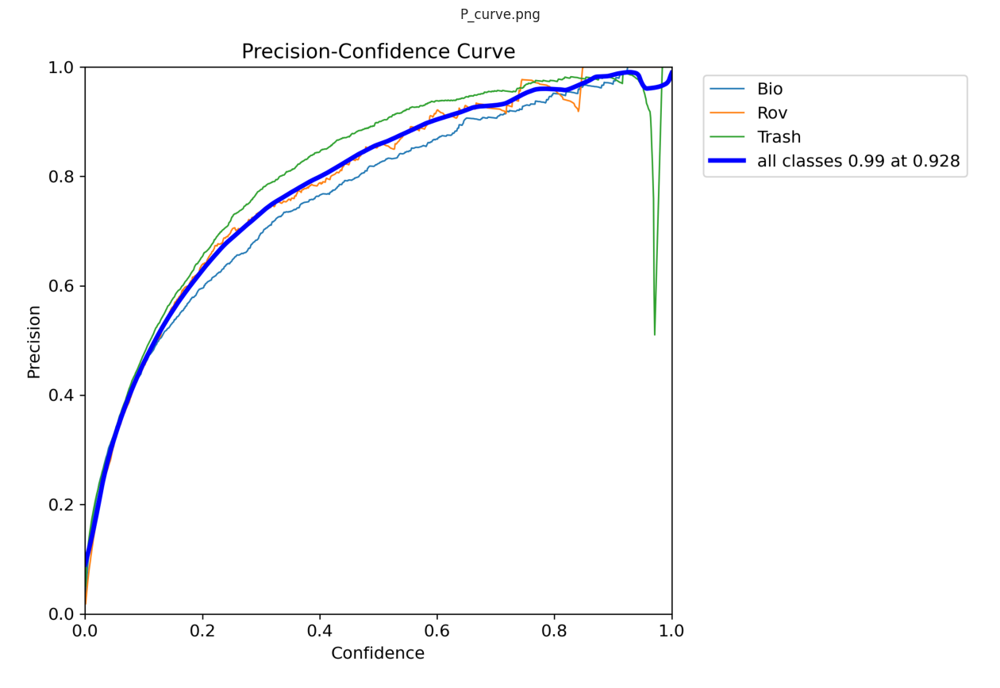

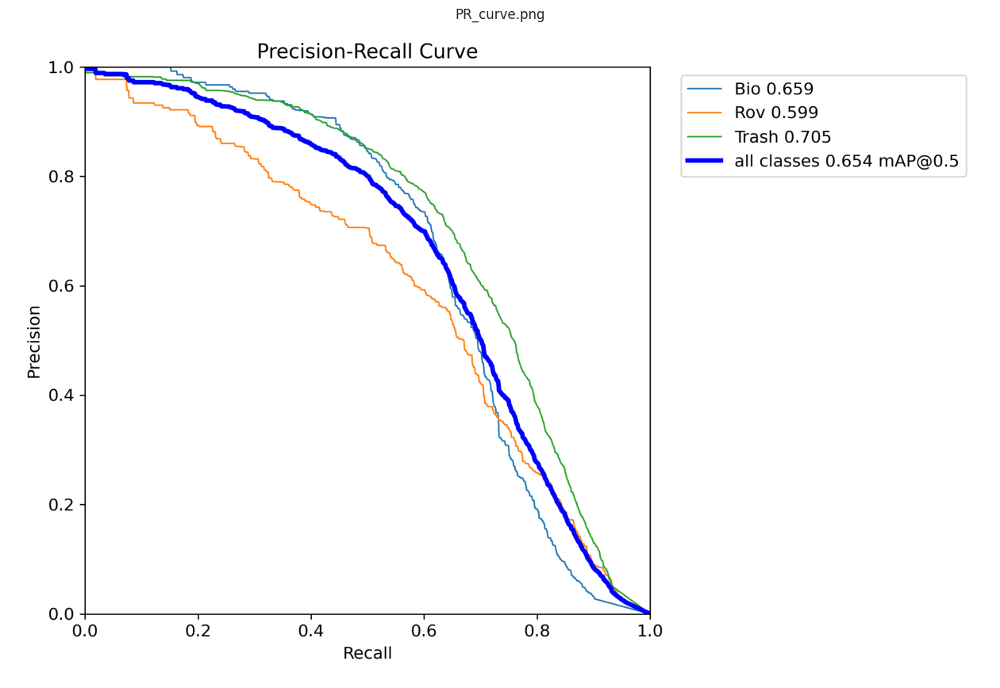

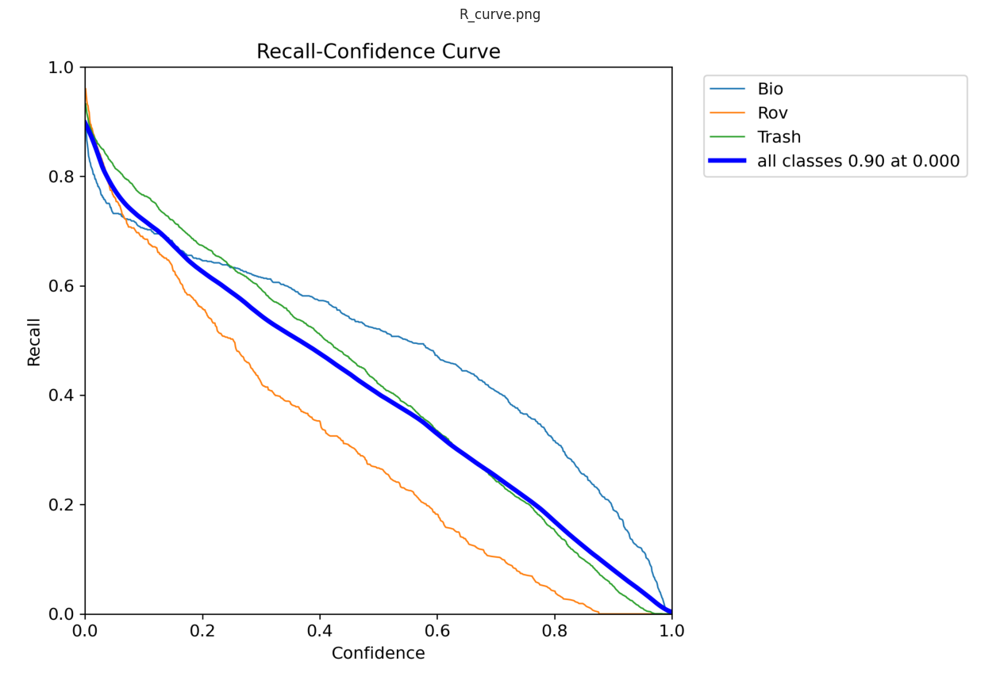

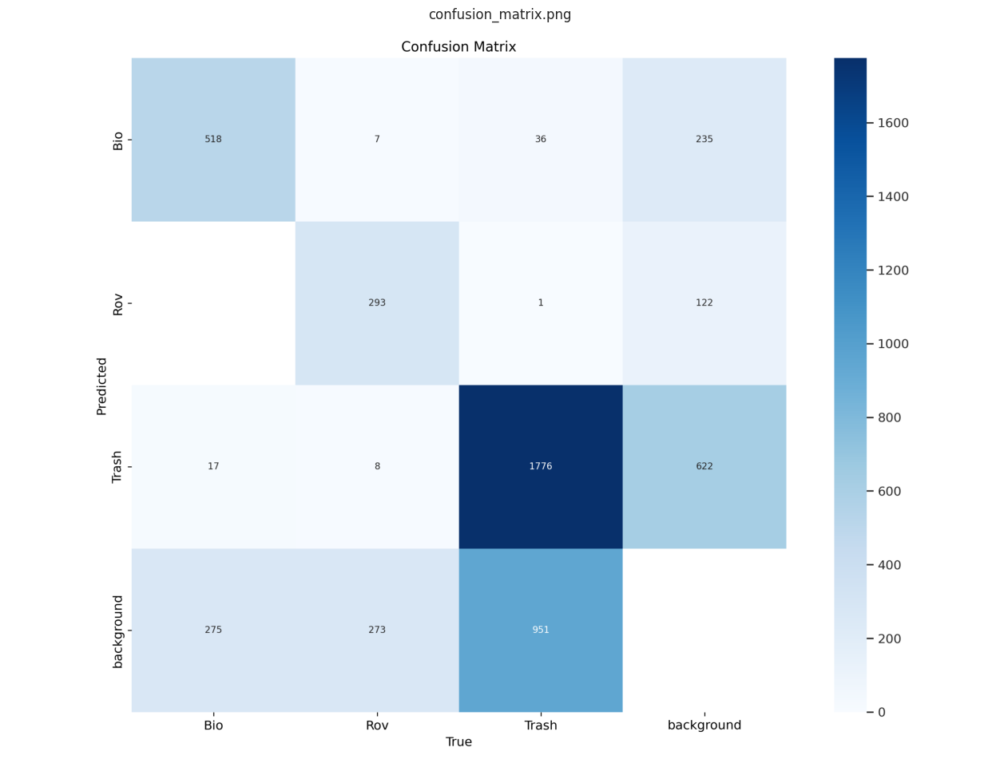

In [21]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

list_of_metrics = ["P_curve.png", "PR_curve.png", "R_curve.png", "confusion_matrix.png"]

for i in list_of_metrics:
    img_path = f"/content/runs/detect/train/{i}"

    # Read the image
    img = cv2.imread(img_path)

    if img is not None:
        # Convert BGR to RGB (for proper visualization)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Display the image
        plt.figure(figsize=(16, 12))
        plt.imshow(img)
        plt.axis("off")  # Hide axes
        plt.title(i)  # Set title
        plt.show()
    else:
        print(f"⚠️ Error: {i} not found at {img_path}")


In [22]:
import pandas as pd
results = pd.read_csv("/content/runs/detect/train/results.csv")
results.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,223.413,2.85508,7.66190,3.15879,0.30267,0.15127,0.11101,0.05187,3.53359,5.93923,4.08988,0.000475,0.000475,0.000475
1,2,391.154,3.09272,5.19046,3.26777,0.40414,0.34441,0.28085,0.14005,3.25207,4.59366,3.53288,0.000763,0.000763,0.000763
2,3,556.224,3.04361,4.43931,3.20952,0.48068,0.43068,0.39017,0.21429,3.10717,3.70862,3.36845,0.000862,0.000862,0.000862
3,4,720.982,2.88854,3.89089,3.11123,0.59043,0.52119,0.54912,0.33293,2.91704,2.95743,3.17617,0.000580,0.000580,0.000580
4,5,888.023,2.74274,3.44478,2.98709,0.67889,0.59565,0.65428,0.41907,2.74141,2.49431,2.97079,0.000297,0.000297,0.000297


In [23]:
# Loading the best performing model
Valid_model = YOLO('/content/runs/detect/train/weights/best.pt')

# Evaluating the model on the testset
metrics = Valid_model.val(split = 'test')

Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 125 layers, 2,695,586 parameters, 0 gradients, 8.2 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 2873 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2873/2873 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 180/180 [00:41<00:00,  4.34it/s]


                   all       2873       4155      0.678      0.596      0.654      0.419
                   Bio        617        810      0.636      0.638      0.659      0.466
                   Rov        452        581      0.689      0.506        0.6       0.39
                 Trash       2291       2764      0.709      0.644      0.705      0.402
Speed: 1.9ms preprocess, 4.8ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val2


In [26]:
# final results
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

precision(B):  0.6780395972153332
metrics/recall(B):  0.5959760393703596
metrics/mAP50(B):  0.6543881545096768
metrics/mAP50-95(B):  0.41910355468896027


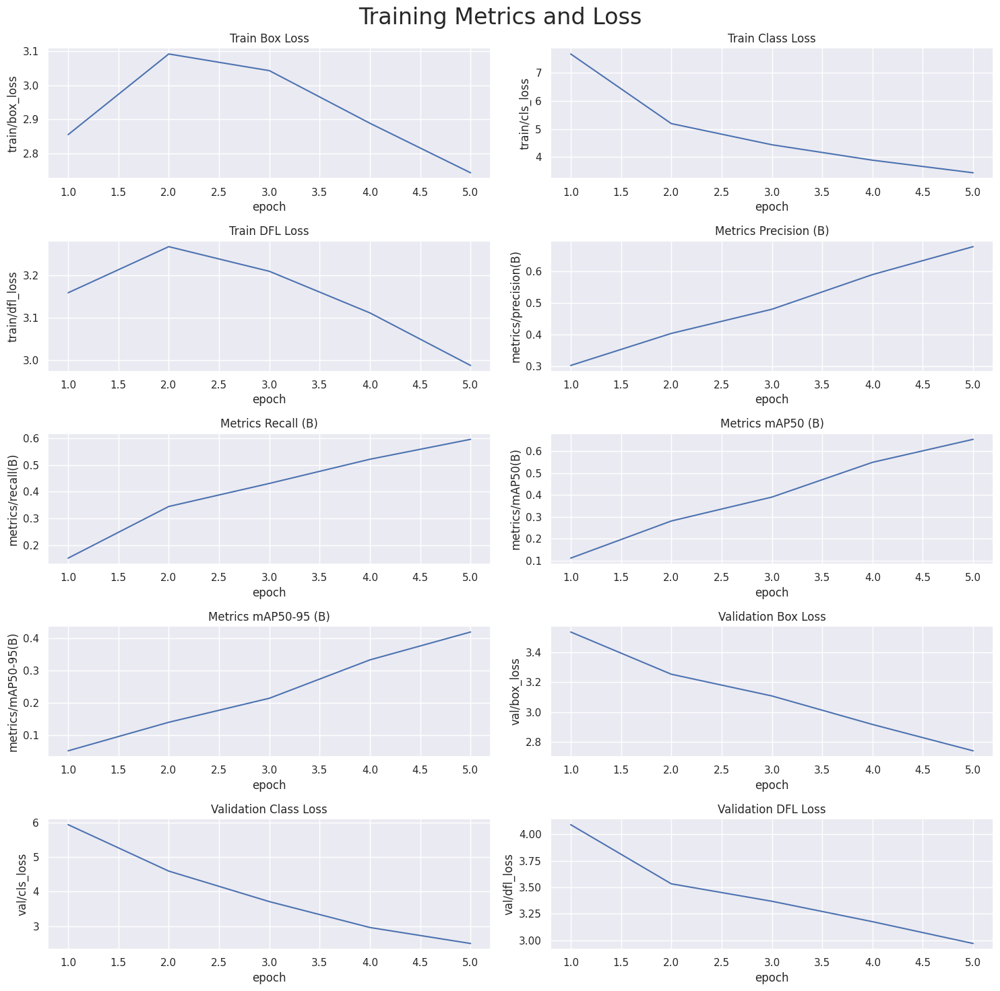

In [25]:
import seaborn as sns
results.columns = results.columns.str.strip()
# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=results, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=results, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=results, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=results, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=results, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=results, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=results, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=results, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=results, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=results, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()


image 1/1 /kaggle/working/test/images/FishDataset346_png_jpg.rf.f40f1e38c2af221f7dd89ae6aa73fb30.jpg: 640x640 (no detections), 24.9ms
Speed: 4.4ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


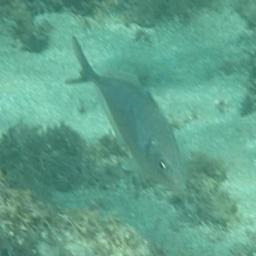


image 1/1 /kaggle/working/test/images/bio0002_frame0000348_jpg.rf.45f658686912fabf4975cce39ef2a4d6.jpg: 640x640 1 Bio, 19.0ms
Speed: 5.1ms preprocess, 19.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


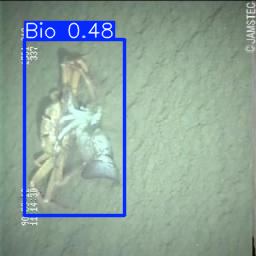


image 1/1 /kaggle/working/test/images/frame_01050_png_jpg.rf.c97e5dce2bf4e8d45c9e3db163c9bfe8.jpg: 640x640 (no detections), 28.0ms
Speed: 4.1ms preprocess, 28.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


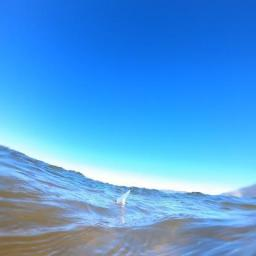


image 1/1 /kaggle/working/test/images/FishDataset111_png_jpg.rf.3ece43460a1eafc9da2213a8c68edf82.jpg: 640x640 1 Bio, 16.6ms
Speed: 4.1ms preprocess, 16.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


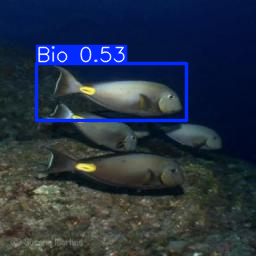


image 1/1 /kaggle/working/test/images/vid_000123_frame0000029_jpg.rf.4fb4ebcbf8d6325200c17b17f5cb1484.jpg: 640x640 1 Trash, 20.5ms
Speed: 5.7ms preprocess, 20.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


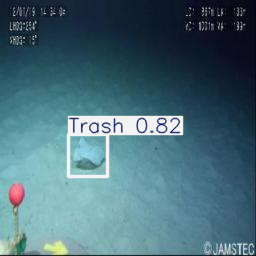


image 1/1 /kaggle/working/test/images/obj1656_frame0000578_jpg.rf.170e9a42c96552a10e20063547618c95.jpg: 640x640 1 Trash, 18.8ms
Speed: 4.4ms preprocess, 18.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


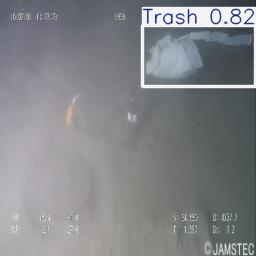


image 1/1 /kaggle/working/test/images/vid_000158_frame0000069_jpg.rf.771bfff2c0166f662d6dab444e5453af.jpg: 640x640 1 Rov, 1 Trash, 16.3ms
Speed: 4.1ms preprocess, 16.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


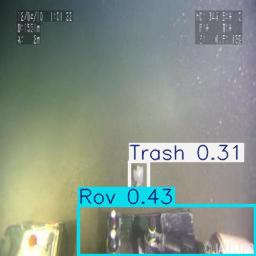


image 1/1 /kaggle/working/test/images/obj0319_frame0000025_jpg.rf.1da62665f5d327285b8ad9070f8fcacf.jpg: 640x640 1 Trash, 16.5ms
Speed: 4.2ms preprocess, 16.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


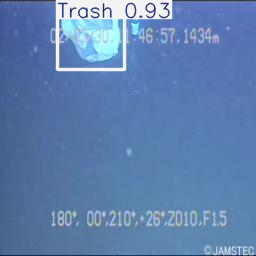


image 1/1 /kaggle/working/test/images/obj1505_frame0000252_jpg.rf.01a125164279881793edbf1c768e12f6.jpg: 640x640 1 Trash, 28.7ms
Speed: 4.0ms preprocess, 28.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


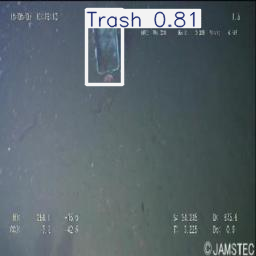


image 1/1 /kaggle/working/test/images/frame_00700_png_jpg.rf.e4f80bbd146ca7c911bfea9e50a63d65.jpg: 640x640 (no detections), 20.3ms
Speed: 4.1ms preprocess, 20.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


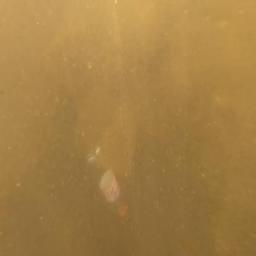


image 1/1 /kaggle/working/test/images/obj1061_frame0000109_jpg.rf.3c963f33085909a3c8e2f8a6c4caf58c.jpg: 640x640 1 Trash, 19.8ms
Speed: 4.0ms preprocess, 19.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


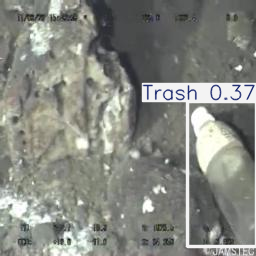


image 1/1 /kaggle/working/test/images/bio0016_frame0000187_jpg.rf.971ddcc2bb692e826bf57c5d737c6f37.jpg: 640x640 1 Bio, 29.0ms
Speed: 6.4ms preprocess, 29.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


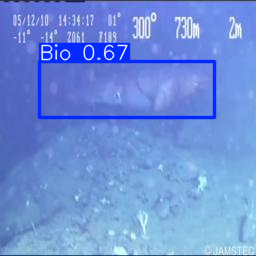


image 1/1 /kaggle/working/test/images/bio0000_frame0000216_jpg.rf.5053d964c4453be28b6546b545fa72f8.jpg: 640x640 1 Bio, 26.2ms
Speed: 4.0ms preprocess, 26.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


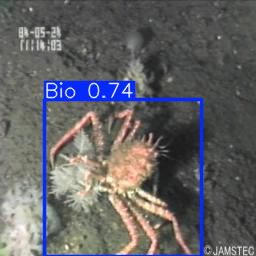


image 1/1 /kaggle/working/test/images/obj1073_frame0000026_jpg.rf.a357ba6492cdc7e905bb4be1e0054179.jpg: 640x640 1 Rov, 1 Trash, 31.3ms
Speed: 6.5ms preprocess, 31.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


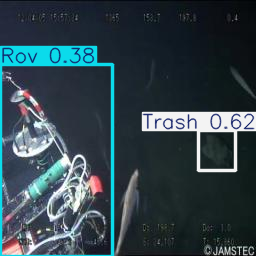


image 1/1 /kaggle/working/test/images/obj1654_frame0000348_jpg.rf.c23661e034815c3ba4eaf1b85b4cad49.jpg: 640x640 2 Trashs, 21.2ms
Speed: 4.0ms preprocess, 21.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


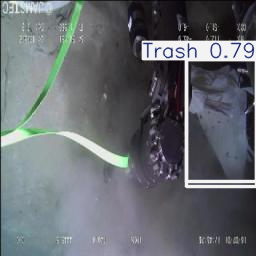


image 1/1 /kaggle/working/test/images/frame_01800_png_jpg.rf.711f517adbe90259379a00177347cc41.jpg: 640x640 2 Trashs, 21.8ms
Speed: 4.8ms preprocess, 21.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


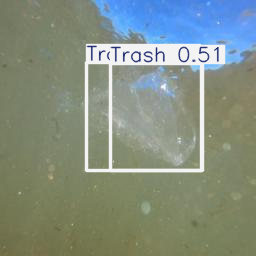


image 1/1 /kaggle/working/test/images/frame_00090_png_jpg.rf.09db1ae62fdc18f67885433054dffb3d.jpg: 640x640 1 Trash, 21.7ms
Speed: 3.8ms preprocess, 21.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


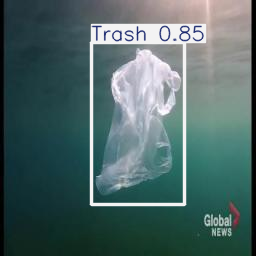


image 1/1 /kaggle/working/test/images/vid_000255_frame0000034_jpg.rf.e5b1f6eb37e382f745297fbac4d119de.jpg: 640x640 1 Trash, 20.2ms
Speed: 3.9ms preprocess, 20.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


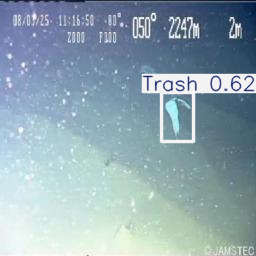


image 1/1 /kaggle/working/test/images/obj1616_frame0000108_jpg.rf.b05e95fa8993d66d2cb1f8b38966190d.jpg: 640x640 2 Rovs, 1 Trash, 17.5ms
Speed: 4.0ms preprocess, 17.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


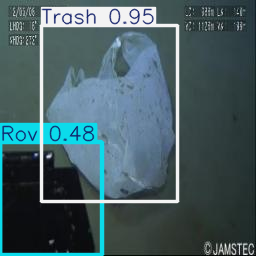


image 1/1 /kaggle/working/test/images/vid_000245_frame0000014_jpg.rf.3944514e8ee19804c3319dd04e720c85.jpg: 640x640 (no detections), 16.0ms
Speed: 3.6ms preprocess, 16.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


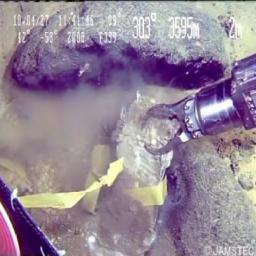


image 1/1 /kaggle/working/test/images/obj0340_frame0000009_jpg.rf.4c9a5658149e0b81507030781c526cf7.jpg: 640x640 1 Trash, 22.7ms
Speed: 4.0ms preprocess, 22.7ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)


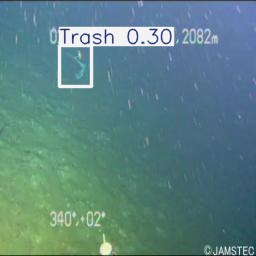


image 1/1 /kaggle/working/test/images/vid_000120_frame0000007_jpg.rf.baf4a39b99ae0cb20cbf119b9f180ed3.jpg: 640x640 2 Trashs, 25.0ms
Speed: 4.1ms preprocess, 25.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


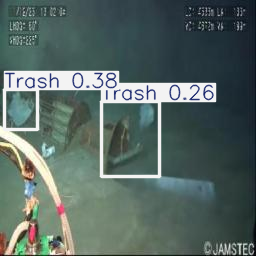


image 1/1 /kaggle/working/test/images/obj1505_frame0000262_jpg.rf.93f7d569f5e98997b09943e3a7664add.jpg: 640x640 1 Trash, 17.2ms
Speed: 4.0ms preprocess, 17.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


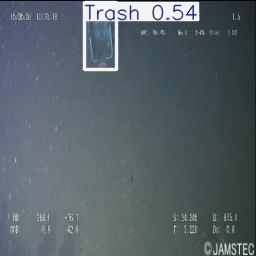


image 1/1 /kaggle/working/test/images/bio0012_frame0000170_jpg.rf.2c91330fdf49440d9b02cd86719a7873.jpg: 640x640 1 Bio, 17.2ms
Speed: 4.5ms preprocess, 17.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


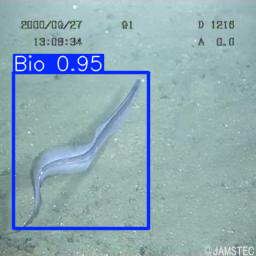


image 1/1 /kaggle/working/test/images/obj1502_frame0000198_jpg.rf.55fa4d247fa12cce4fa385aad422833b.jpg: 640x640 1 Trash, 16.6ms
Speed: 4.0ms preprocess, 16.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


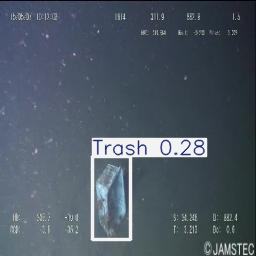


image 1/1 /kaggle/working/test/images/obj1107_frame0000041_jpg.rf.753329ec568213d43dbebf2c322ad97d.jpg: 640x640 1 Trash, 19.9ms
Speed: 4.0ms preprocess, 19.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


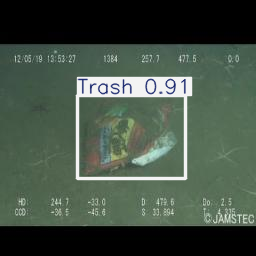


image 1/1 /kaggle/working/test/images/frame_01950_png_jpg.rf.93dc48d59731d3e235ca0c10833e653d.jpg: 640x640 1 Trash, 20.9ms
Speed: 4.1ms preprocess, 20.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


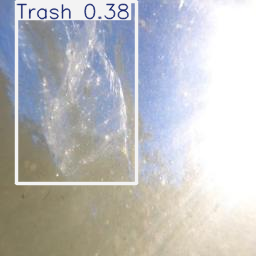


image 1/1 /kaggle/working/test/images/obj1648_frame0000279_jpg.rf.dc1a86717d5f1ecfa43b84a07c58268d.jpg: 640x640 1 Trash, 21.6ms
Speed: 3.9ms preprocess, 21.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


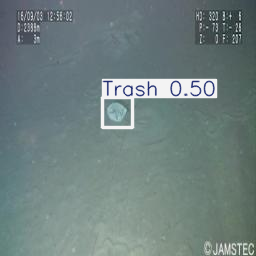


image 1/1 /kaggle/working/test/images/obj0317_frame0000068_jpg.rf.0b9c1d1082e18bfd46ee7ffeb3a84553.jpg: 640x640 2 Trashs, 16.3ms
Speed: 3.9ms preprocess, 16.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


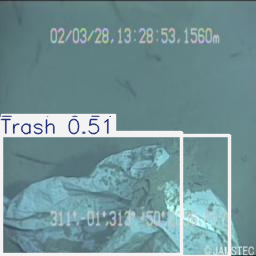


image 1/1 /kaggle/working/test/images/obj0017_frame0000037_jpg.rf.643608e800f0f892e711280e8b213319.jpg: 640x640 1 Trash, 23.1ms
Speed: 3.8ms preprocess, 23.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


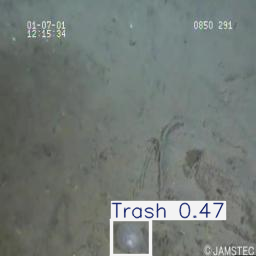


image 1/1 /kaggle/working/test/images/obj1246_frame0000070_jpg.rf.682790711f91d4f464a0203764f18542.jpg: 640x640 1 Trash, 23.7ms
Speed: 4.3ms preprocess, 23.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


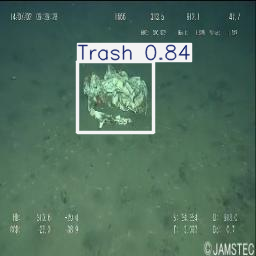


image 1/1 /kaggle/working/test/images/obj1280_frame0000073_jpg.rf.cab8037c6dfddc8bba103ac777f848fe.jpg: 640x640 2 Trashs, 23.2ms
Speed: 3.8ms preprocess, 23.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


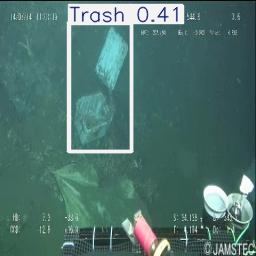


image 1/1 /kaggle/working/test/images/vid_000332_frame0000115_jpg.rf.c17ed961fcd76b461fd80c5ee08bce7a.jpg: 640x640 (no detections), 21.1ms
Speed: 4.3ms preprocess, 21.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


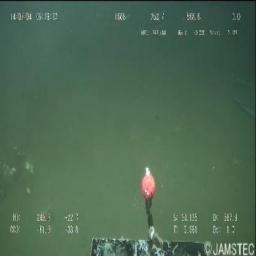


image 1/1 /kaggle/working/test/images/obj1251_frame0000067_jpg.rf.6e62b1397591d0632edfab43e794193f.jpg: 640x640 1 Trash, 21.5ms
Speed: 4.1ms preprocess, 21.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


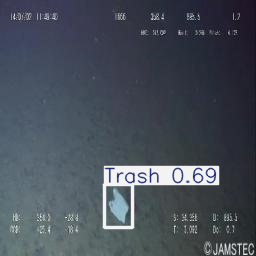


image 1/1 /kaggle/working/test/images/bio0015_frame0000164_jpg.rf.dab56ed8f088ef8df8f5298ba5aea521.jpg: 640x640 2 Bios, 16.6ms
Speed: 4.5ms preprocess, 16.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


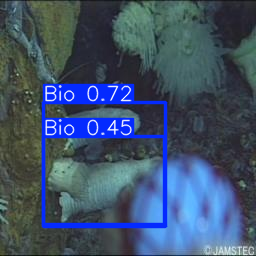


image 1/1 /kaggle/working/test/images/obj0340_frame0000024_jpg.rf.128b542477c2a11d628b1fa3a955fd75.jpg: 640x640 1 Trash, 21.8ms
Speed: 4.0ms preprocess, 21.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


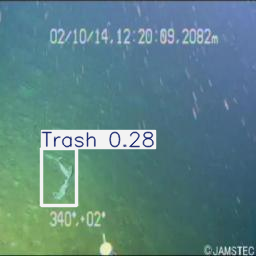


image 1/1 /kaggle/working/test/images/obj0011_frame0000033_jpg.rf.cffa7d0cb7f1b2b7896998b4aa5a99a5.jpg: 640x640 1 Trash, 21.4ms
Speed: 4.1ms preprocess, 21.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


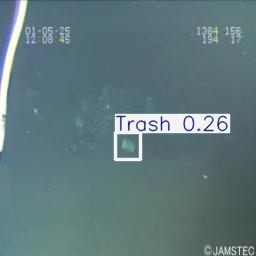


image 1/1 /kaggle/working/test/images/bio0004_frame0000143_jpg.rf.2ade3969d78134fe7f2711f55b21707c.jpg: 640x640 1 Bio, 22.9ms
Speed: 4.0ms preprocess, 22.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


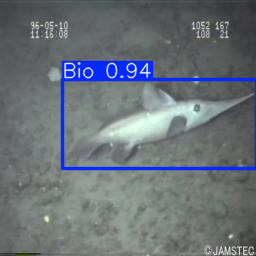


image 1/1 /kaggle/working/test/images/obj1667_frame0000056_jpg.rf.b112718935f46ee27c53865249e001a9.jpg: 640x640 2 Rovs, 17.1ms
Speed: 3.8ms preprocess, 17.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


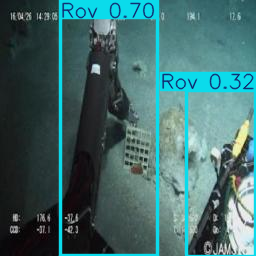


image 1/1 /kaggle/working/test/images/bio0001_frame0000464_jpg.rf.e63d97b4ca066c85d104006dc600e096.jpg: 640x640 2 Trashs, 16.2ms
Speed: 4.2ms preprocess, 16.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


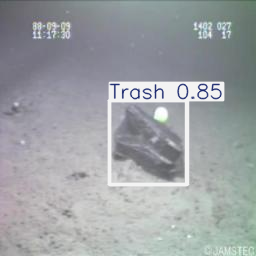


image 1/1 /kaggle/working/test/images/obj1502_frame0000306_jpg.rf.5945276ec07fe3695e0cd0e7b8284834.jpg: 640x640 2 Trashs, 15.4ms
Speed: 4.0ms preprocess, 15.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


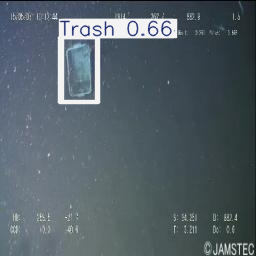


image 1/1 /kaggle/working/test/images/obj0708_frame0000017_jpg.rf.6ea1b912b0c0494a4fbac9d2ebc783cb.jpg: 640x640 (no detections), 16.1ms
Speed: 4.1ms preprocess, 16.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


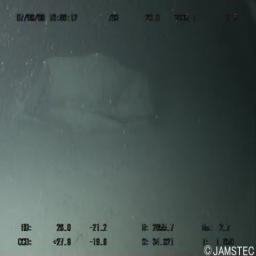


image 1/1 /kaggle/working/test/images/obj0753_frame0000149_jpg.rf.da4452d540dd4e78272bfb43e5464f7d.jpg: 640x640 1 Rov, 15.1ms
Speed: 3.9ms preprocess, 15.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


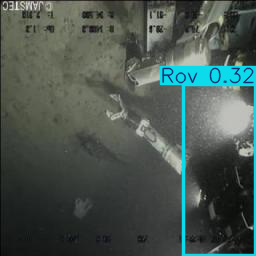


image 1/1 /kaggle/working/test/images/obj1617_frame0000104_jpg.rf.6916a24f55850a364b884a3e40ce6806.jpg: 640x640 1 Rov, 1 Trash, 15.2ms
Speed: 4.1ms preprocess, 15.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


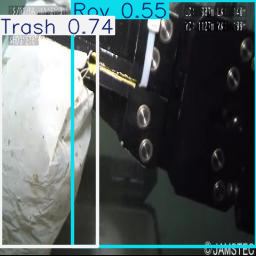


image 1/1 /kaggle/working/test/images/bio0004_frame0000283_jpg.rf.747299f942168336f1d6c8111ac7b954.jpg: 640x640 2 Bios, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


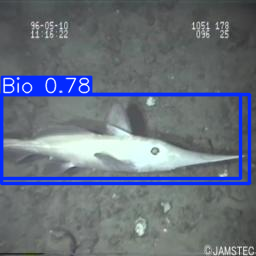


image 1/1 /kaggle/working/test/images/FishDataset628_png_jpg.rf.4b5811af336164743f9ca7e4fbb58957.jpg: 640x640 1 Bio, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


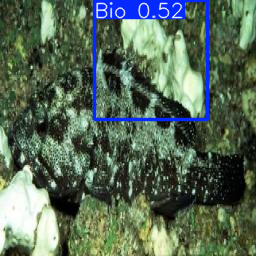


image 1/1 /kaggle/working/test/images/vid_000214_frame0000001_jpg.rf.4b7a9be03a29befd1638e83ad06c7e5a.jpg: 640x640 2 Trashs, 14.8ms
Speed: 3.9ms preprocess, 14.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


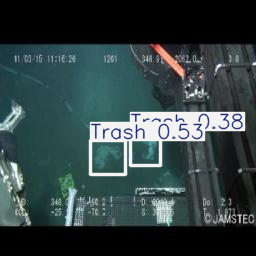


image 1/1 /kaggle/working/test/images/obj1107_frame0000027_jpg.rf.c7c07193c2fa1513a52e2d0971eb2c4c.jpg: 640x640 1 Trash, 14.8ms
Speed: 3.8ms preprocess, 14.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


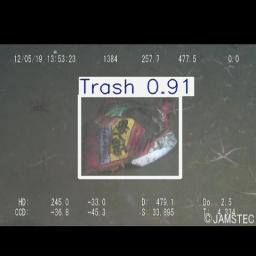


image 1/1 /kaggle/working/test/images/obj0334_frame0000003_jpg.rf.bc16914fc8c98b79f0582973945b37d9.jpg: 640x640 1 Trash, 14.0ms
Speed: 3.9ms preprocess, 14.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


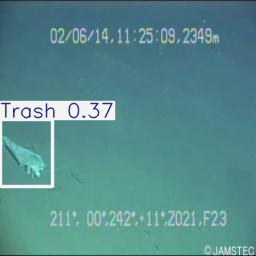


image 1/1 /kaggle/working/test/images/frame_01175_png_jpg.rf.84bf0f38d6c4378624c7261be8ad2140.jpg: 640x640 1 Trash, 14.3ms
Speed: 3.7ms preprocess, 14.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


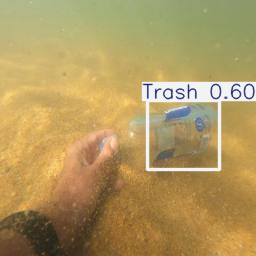


image 1/1 /kaggle/working/test/images/obj1297_frame0000243_jpg.rf.54c46de208884fc2c4130b9f53199c75.jpg: 640x640 2 Trashs, 14.9ms
Speed: 3.9ms preprocess, 14.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


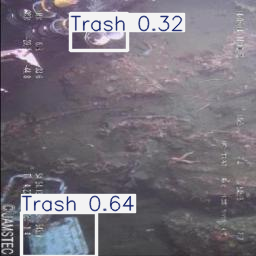


image 1/1 /kaggle/working/test/images/frame_00650_png_jpg.rf.9e88c4b4c71913319970575720ee7429.jpg: 640x640 1 Trash, 16.3ms
Speed: 3.6ms preprocess, 16.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


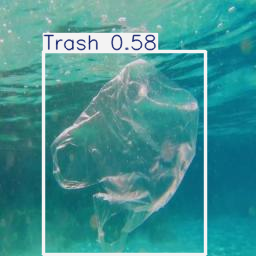


image 1/1 /kaggle/working/test/images/frame_00550_png_jpg.rf.709863fe4d0f46f52a8c437ee665309f.jpg: 640x640 1 Trash, 15.7ms
Speed: 3.7ms preprocess, 15.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


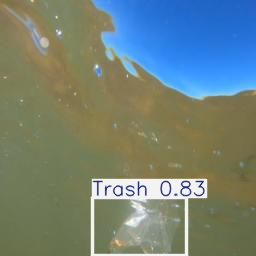


image 1/1 /kaggle/working/test/images/obj0337_frame0000016_jpg.rf.7f54c5fcb9b11bccf5215272ecf9cec6.jpg: 640x640 1 Trash, 19.9ms
Speed: 3.8ms preprocess, 19.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


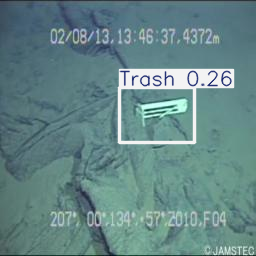


image 1/1 /kaggle/working/test/images/obj1054_frame0000035_jpg.rf.426fca46251d85f0280decc76fcb2098.jpg: 640x640 1 Trash, 20.9ms
Speed: 4.1ms preprocess, 20.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


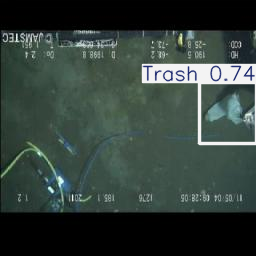


image 1/1 /kaggle/working/test/images/bio0016_frame0000131_jpg.rf.6d9fccf9e4fcf4c30b4b2bae1a0d6c41.jpg: 640x640 1 Bio, 21.7ms
Speed: 4.0ms preprocess, 21.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


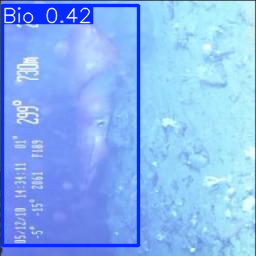


image 1/1 /kaggle/working/test/images/obj0333_frame0000055_jpg.rf.1677c1c715ddf44b733ab24f063582a7.jpg: 640x640 2 Trashs, 23.5ms
Speed: 4.2ms preprocess, 23.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


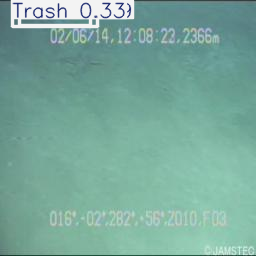


image 1/1 /kaggle/working/test/images/bio0001_frame0000051_jpg.rf.d15177e71ac8f1708e77e2a7a71049d3.jpg: 640x640 2 Trashs, 23.4ms
Speed: 3.1ms preprocess, 23.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


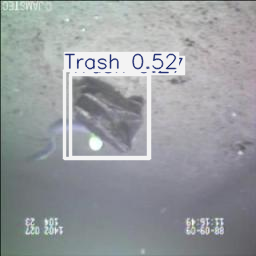


image 1/1 /kaggle/working/test/images/bio0000_frame0000143_jpg.rf.4bdb46665a35f81ed0f2a79eff6cc824.jpg: 640x640 1 Bio, 26.2ms
Speed: 5.9ms preprocess, 26.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


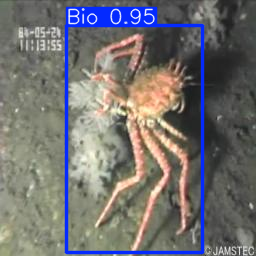


image 1/1 /kaggle/working/test/images/vid_000077_frame0000036_jpg.rf.41db6a4ff88364eb3d885bea9e8a3180.jpg: 640x640 (no detections), 19.1ms
Speed: 3.8ms preprocess, 19.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


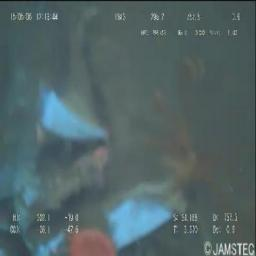


image 1/1 /kaggle/working/test/images/obj1024_frame0000159_jpg.rf.210ed2d1ba58f1878c9a8a8be12d6d3e.jpg: 640x640 (no detections), 18.3ms
Speed: 3.5ms preprocess, 18.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


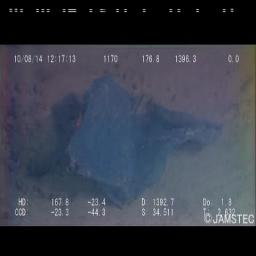


image 1/1 /kaggle/working/test/images/vid_000304_frame0000026_jpg.rf.3f3dee610848ba95788d32eb1f38a86c.jpg: 640x640 (no detections), 22.5ms
Speed: 3.6ms preprocess, 22.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


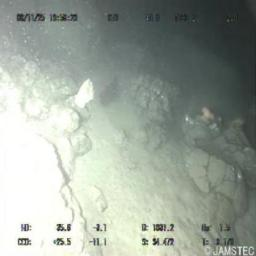


image 1/1 /kaggle/working/test/images/obj1297_frame0000092_jpg.rf.61d310547a741d7d5672ea23c8bf8bf1.jpg: 640x640 2 Trashs, 21.9ms
Speed: 3.6ms preprocess, 21.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


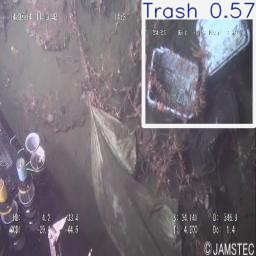


image 1/1 /kaggle/working/test/images/vid_000539_frame0000053_jpg.rf.d3f28e3d4cfeedef18325ee0dd2c50d0.jpg: 640x640 2 Trashs, 21.9ms
Speed: 6.9ms preprocess, 21.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


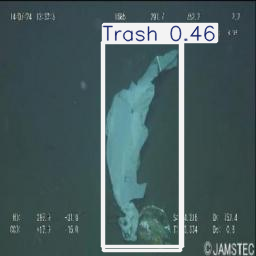


image 1/1 /kaggle/working/test/images/obj0248_frame0000054_jpg.rf.d3582e3ab78a8720235981cf8704a810.jpg: 640x640 1 Trash, 23.4ms
Speed: 3.7ms preprocess, 23.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


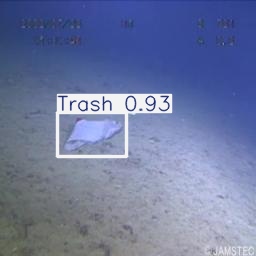


image 1/1 /kaggle/working/test/images/obj0314_frame0000040_jpg.rf.832728e6fb9e22e40d04a24434f5e98e.jpg: 640x640 1 Trash, 23.7ms
Speed: 6.1ms preprocess, 23.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


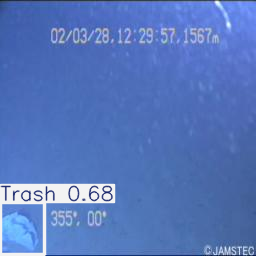


image 1/1 /kaggle/working/test/images/obj1648_frame0000374_jpg.rf.0e3988276b3a02afc62adb0ccff1f515.jpg: 640x640 1 Trash, 26.7ms
Speed: 4.1ms preprocess, 26.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


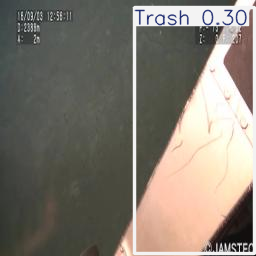


image 1/1 /kaggle/working/test/images/vid_000077_frame0000001_jpg.rf.6db4e4f1ce9498b65abce1855e0bc574.jpg: 640x640 1 Trash, 19.0ms
Speed: 3.8ms preprocess, 19.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


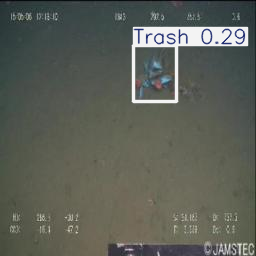


image 1/1 /kaggle/working/test/images/vid_000122_frame0000065_jpg.rf.43cfd7435760925941e04471073f54a7.jpg: 640x640 1 Trash, 36.3ms
Speed: 3.7ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


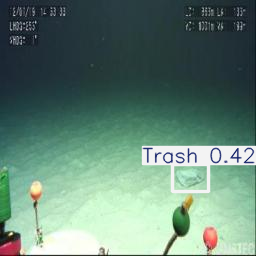


image 1/1 /kaggle/working/test/images/obj1648_frame0000336_jpg.rf.452effc5d775ccaccd4813da6a3601d1.jpg: 640x640 1 Trash, 27.2ms
Speed: 6.1ms preprocess, 27.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


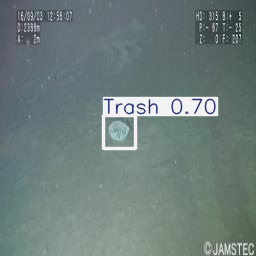


image 1/1 /kaggle/working/test/images/vid_000255_frame0000022_jpg.rf.c9029e897eca7ffb4b478b582d31e894.jpg: 640x640 (no detections), 26.4ms
Speed: 4.0ms preprocess, 26.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


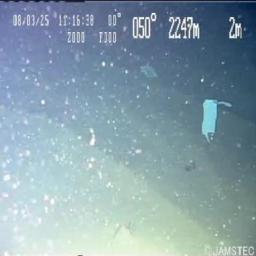


image 1/1 /kaggle/working/test/images/bio0015_frame0000663_jpg.rf.744f65e6c1e436c24ebe40932000ef4a.jpg: 640x640 1 Bio, 20.5ms
Speed: 5.9ms preprocess, 20.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


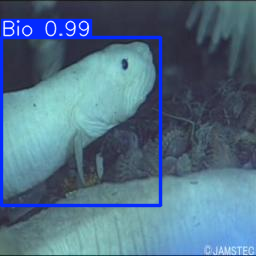


image 1/1 /kaggle/working/test/images/obj1218_frame0000019_jpg.rf.cd0bc7f2a48c3bf0ce977913bfb2251b.jpg: 640x640 1 Trash, 25.1ms
Speed: 4.2ms preprocess, 25.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


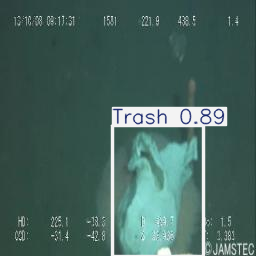


image 1/1 /kaggle/working/test/images/vid_000029_frame0000014_jpg.rf.6604f0ecae92bf1be7cbf4e052c1e788.jpg: 640x640 1 Trash, 25.1ms
Speed: 4.8ms preprocess, 25.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


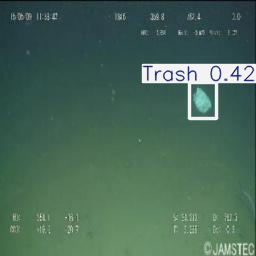


image 1/1 /kaggle/working/test/images/vid_000143_frame0000066_jpg.rf.a5d1e6714429a288af5ddc985f8588e0.jpg: 640x640 (no detections), 21.9ms
Speed: 4.9ms preprocess, 21.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


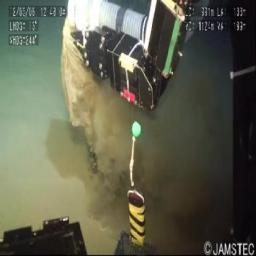


image 1/1 /kaggle/working/test/images/obj1658_frame0000326_jpg.rf.7e2549e6da3f1ed9deb950143929b72f.jpg: 640x640 1 Trash, 28.1ms
Speed: 5.8ms preprocess, 28.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


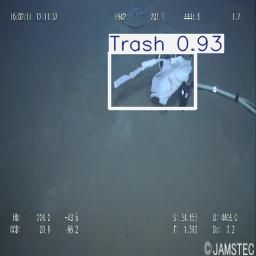


image 1/1 /kaggle/working/test/images/frame_02650_png_jpg.rf.c84f711160d6f1381e9787bbaa673929.jpg: 640x640 1 Trash, 30.1ms
Speed: 3.9ms preprocess, 30.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


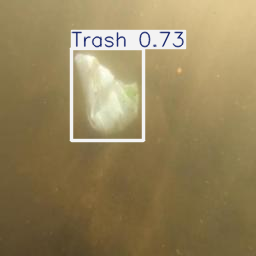


image 1/1 /kaggle/working/test/images/obj0348_frame0000020_jpg.rf.498c95d2eda5b3f2999490f4a2fd91db.jpg: 640x640 (no detections), 23.0ms
Speed: 5.6ms preprocess, 23.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


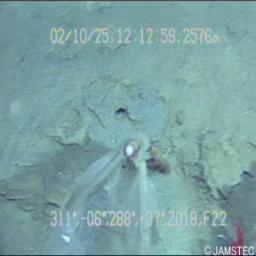


image 1/1 /kaggle/working/test/images/bio0013_frame0000071_jpg.rf.9071f84ab8963629fb306ee2b33c219d.jpg: 640x640 3 Bios, 1 Trash, 21.5ms
Speed: 3.6ms preprocess, 21.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


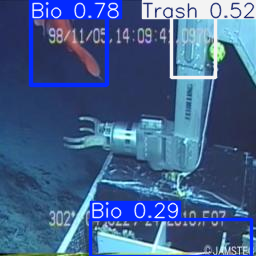


image 1/1 /kaggle/working/test/images/obj1505_frame0000238_jpg.rf.43efe3a99c0c1ee8a701648979d91cd3.jpg: 640x640 1 Trash, 20.6ms
Speed: 3.5ms preprocess, 20.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


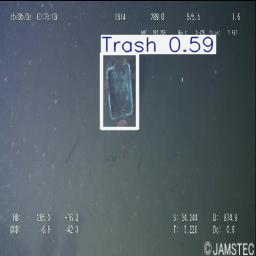


image 1/1 /kaggle/working/test/images/frame_00725_png_jpg.rf.c46171be9095ae7687fdbbe9eba0dc22.jpg: 640x640 (no detections), 19.8ms
Speed: 3.9ms preprocess, 19.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


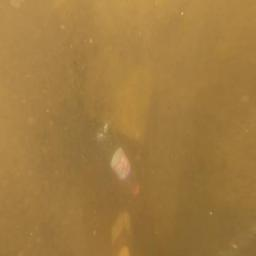


image 1/1 /kaggle/working/test/images/vid_000080_frame0000034_jpg.rf.858d4ef0b523e600aa40417ad5702d33.jpg: 640x640 (no detections), 24.7ms
Speed: 3.4ms preprocess, 24.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


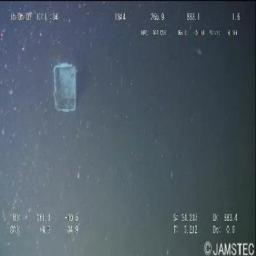


image 1/1 /kaggle/working/test/images/frame_00130_png_jpg.rf.b775787eccf1cc865e0f347405bed275.jpg: 640x640 2 Trashs, 19.3ms
Speed: 3.7ms preprocess, 19.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


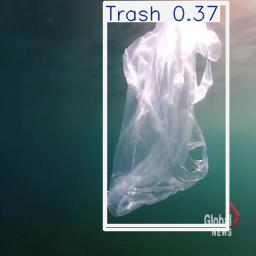


image 1/1 /kaggle/working/test/images/obj1023_frame0000010_jpg.rf.3a0f91e8d681ea0e53952137f4de2a91.jpg: 640x640 1 Bio, 2 Rovs, 1 Trash, 18.8ms
Speed: 4.5ms preprocess, 18.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


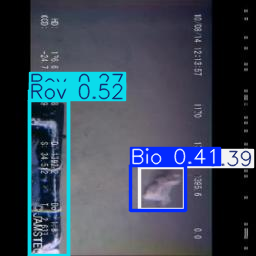


image 1/1 /kaggle/working/test/images/obj1658_frame0002383_jpg.rf.bf396b0320d0beb7d0b583493106cd52.jpg: 640x640 1 Rov, 19.2ms
Speed: 3.5ms preprocess, 19.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


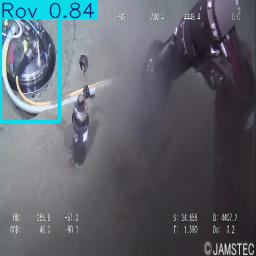


image 1/1 /kaggle/working/test/images/obj0749_frame0000064_jpg.rf.56a395e895ec0db6497674915b0beb91.jpg: 640x640 1 Trash, 20.0ms
Speed: 3.8ms preprocess, 20.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


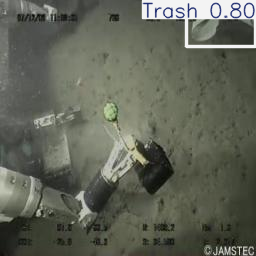


image 1/1 /kaggle/working/test/images/frame_01025_png_jpg.rf.ec9a2ea0177ebd4fe4b3cca1dc824625.jpg: 640x640 (no detections), 22.0ms
Speed: 3.8ms preprocess, 22.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


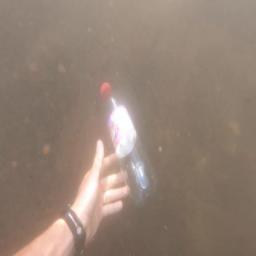


image 1/1 /kaggle/working/test/images/frame_00720_png_jpg.rf.ca3c4930a2b172d3fa6c2c6992c19025.jpg: 640x640 1 Trash, 21.2ms
Speed: 3.5ms preprocess, 21.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


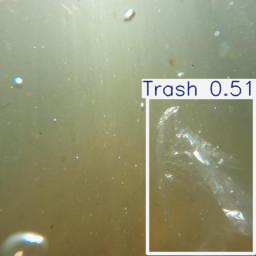


image 1/1 /kaggle/working/test/images/frame_01250_png_jpg.rf.fef5a680719f3e6902243b8541e6d41b.jpg: 640x640 1 Trash, 20.3ms
Speed: 3.7ms preprocess, 20.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


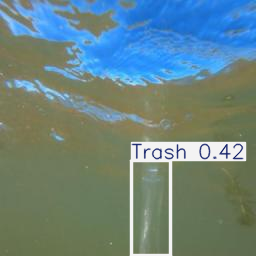


image 1/1 /kaggle/working/test/images/obj1246_frame0000057_jpg.rf.cf39a264be0703ca4c8a632a35fda121.jpg: 640x640 1 Trash, 20.0ms
Speed: 3.5ms preprocess, 20.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


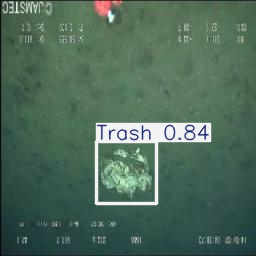


image 1/1 /kaggle/working/test/images/frame_00125_png_jpg.rf.47dceee04bb27cdb8f364a8a58f3b117.jpg: 640x640 (no detections), 14.1ms
Speed: 4.6ms preprocess, 14.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


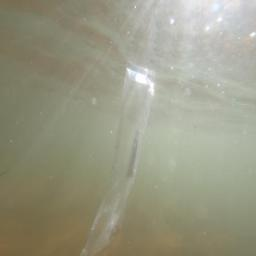


image 1/1 /kaggle/working/test/images/obj1283_frame0000009_jpg.rf.5aac855ccc6dfe5d0afa3ff99d344750.jpg: 640x640 1 Rov, 2 Trashs, 16.2ms
Speed: 3.5ms preprocess, 16.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


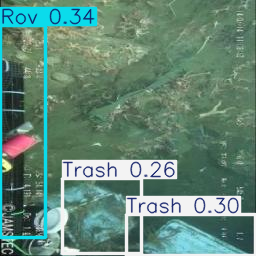


image 1/1 /kaggle/working/test/images/bio0000_frame0000123_jpg.rf.3dea7840c9faf75df3d82be47aad1a44.jpg: 640x640 1 Bio, 18.0ms
Speed: 3.6ms preprocess, 18.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


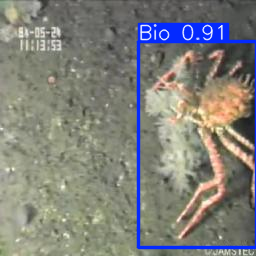


image 1/1 /kaggle/working/test/images/frame_00825_png_jpg.rf.f0562b17d5875bef98252d1a7c885dda.jpg: 640x640 1 Trash, 21.3ms
Speed: 3.3ms preprocess, 21.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


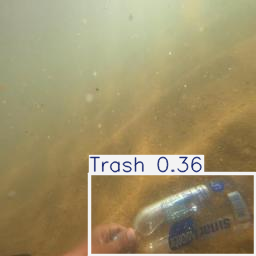


image 1/1 /kaggle/working/test/images/bio0013_frame0000146_jpg.rf.19906b0c04931d1c8d96238c34825398.jpg: 640x640 1 Bio, 1 Rov, 19.9ms
Speed: 5.7ms preprocess, 19.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


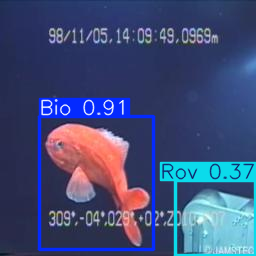


image 1/1 /kaggle/working/test/images/bio0016_frame0000446_jpg.rf.e7f54c0c2da05aa00087ba02fd8cd311.jpg: 640x640 3 Bios, 19.2ms
Speed: 3.4ms preprocess, 19.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


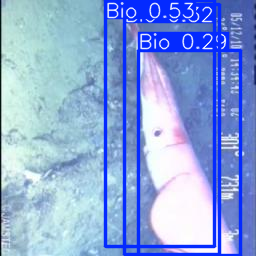


image 1/1 /kaggle/working/test/images/obj1664_frame0000149_jpg.rf.5777666266c15fdf6e501e8a15c78807.jpg: 640x640 1 Trash, 21.3ms
Speed: 3.4ms preprocess, 21.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


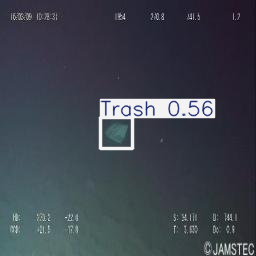


image 1/1 /kaggle/working/test/images/bio0016_frame0000375_jpg.rf.3361c62e3a47d85cd7e146a650e7a5ab.jpg: 640x640 2 Bios, 14.4ms
Speed: 3.3ms preprocess, 14.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


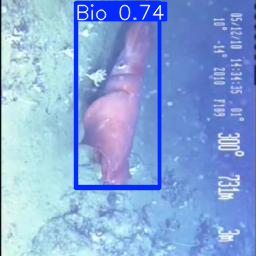


image 1/1 /kaggle/working/test/images/obj0228_frame0000030_jpg.rf.386fd9c480f2910920f3e07468b2b21c.jpg: 640x640 1 Trash, 17.8ms
Speed: 3.4ms preprocess, 17.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


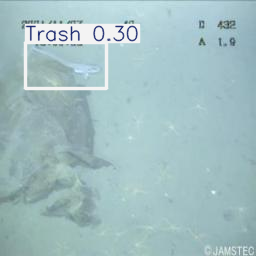


image 1/1 /kaggle/working/test/images/obj0854_frame0000014_jpg.rf.d09c9f92b58f1e7080352f8b431b5812.jpg: 640x640 1 Trash, 13.9ms
Speed: 4.6ms preprocess, 13.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


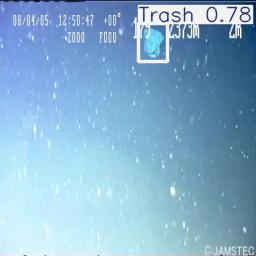


image 1/1 /kaggle/working/test/images/obj0347_frame0000069_jpg.rf.7e4202fbcaf7e76b07a6f7ed2de6ca54.jpg: 640x640 (no detections), 16.7ms
Speed: 4.0ms preprocess, 16.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


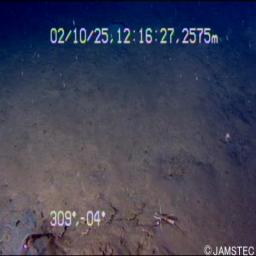


image 1/1 /kaggle/working/test/images/obj0332_frame0000074_jpg.rf.e580b52fe75a1a1667fe6d2a6b48c6c4.jpg: 640x640 4 Trashs, 16.3ms
Speed: 3.8ms preprocess, 16.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


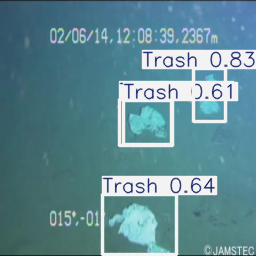


image 1/1 /kaggle/working/test/images/vid_000255_frame0000042_jpg.rf.3f1892f4edf3d83171a0a7cd513d5ef0.jpg: 640x640 (no detections), 15.9ms
Speed: 6.6ms preprocess, 15.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


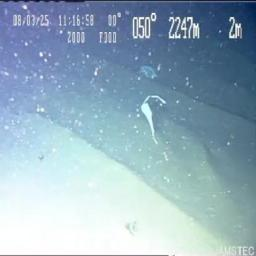


image 1/1 /kaggle/working/test/images/bio0000_frame0000123_jpg.rf.386ba657ad697663265b358bf345cc69.jpg: 640x640 1 Bio, 15.8ms
Speed: 7.0ms preprocess, 15.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


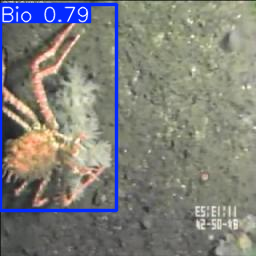


image 1/1 /kaggle/working/test/images/obj0243_frame0000028_jpg.rf.f08543ecc5313a1ad2b8b5a786b1dfdc.jpg: 640x640 1 Trash, 20.1ms
Speed: 6.8ms preprocess, 20.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


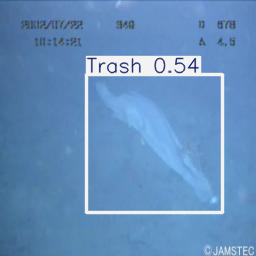


image 1/1 /kaggle/working/test/images/obj0228_frame0000023_jpg.rf.810edc207a7334c79f633ac22988f66b.jpg: 640x640 1 Trash, 17.2ms
Speed: 4.5ms preprocess, 17.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


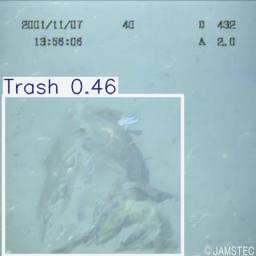


image 1/1 /kaggle/working/test/images/obj0241_frame0000061_jpg.rf.3fff92abdf62300b2dae7c90c6396ef1.jpg: 640x640 1 Trash, 14.4ms
Speed: 4.8ms preprocess, 14.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


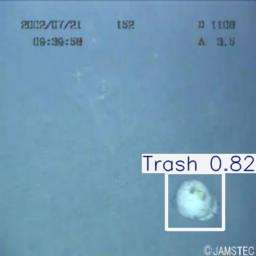


image 1/1 /kaggle/working/test/images/obj0749_frame0000090_jpg.rf.3b82f88bcec157c47480516761c02630.jpg: 640x640 1 Trash, 14.2ms
Speed: 6.8ms preprocess, 14.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


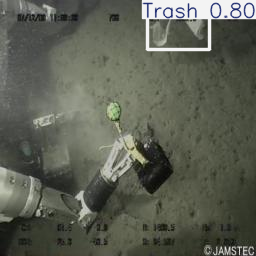


image 1/1 /kaggle/working/test/images/obj0309_frame0000031_jpg.rf.c9643f05feae6f59bdb16507f425e3b0.jpg: 640x640 4 Trashs, 16.2ms
Speed: 5.9ms preprocess, 16.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


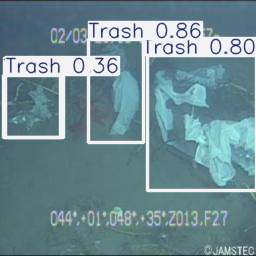


image 1/1 /kaggle/working/test/images/obj0334_frame0000039_jpg.rf.f379be697ebef1343e409d072940bdf3.jpg: 640x640 2 Trashs, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


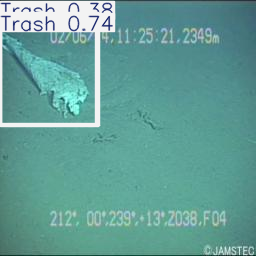


image 1/1 /kaggle/working/test/images/vid_000118_frame0000038_jpg.rf.b103771f126f90a5e1d1ce4ecd86c865.jpg: 640x640 2 Trashs, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


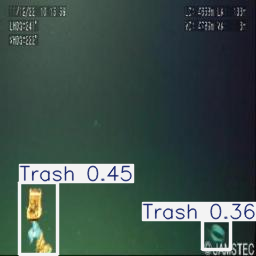


image 1/1 /kaggle/working/test/images/obj1111_frame0000145_jpg.rf.4b736c4b2ad0c4ae9c96a3d119d402a2.jpg: 640x640 1 Trash, 16.8ms
Speed: 3.6ms preprocess, 16.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


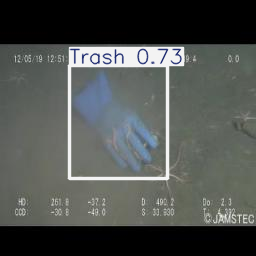


image 1/1 /kaggle/working/test/images/obj0747_frame0000063_jpg.rf.7a065e80c283c8e8b25f22f38b368cf9.jpg: 640x640 1 Trash, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


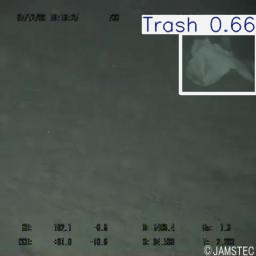


image 1/1 /kaggle/working/test/images/frame_00810_png_jpg.rf.cee44396332d7863fed5a1ea0a8ca019.jpg: 640x640 1 Trash, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


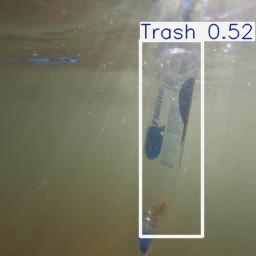


image 1/1 /kaggle/working/test/images/vid_000109_frame0000016_jpg.rf.dff5b927fffe40e875101a76dfdf0d26.jpg: 640x640 2 Trashs, 19.8ms
Speed: 3.5ms preprocess, 19.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


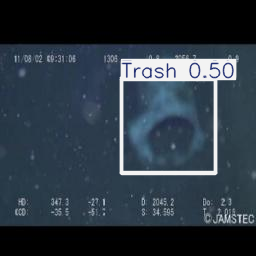


image 1/1 /kaggle/working/test/images/obj0301_frame0000056_jpg.rf.691dca70cd097878db521be44251b974.jpg: 640x640 1 Trash, 19.8ms
Speed: 3.6ms preprocess, 19.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


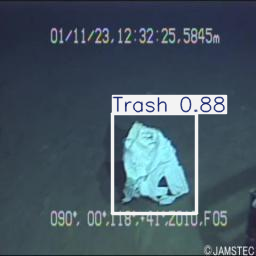


image 1/1 /kaggle/working/test/images/bio0002_frame0000238_jpg.rf.e6f817bad1ee2e49d6d02f5f873b4a79.jpg: 640x640 1 Bio, 17.5ms
Speed: 5.5ms preprocess, 17.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


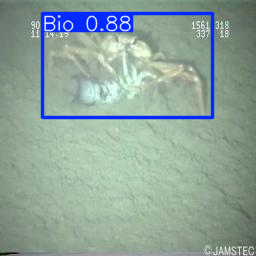


image 1/1 /kaggle/working/test/images/bio0000_frame0000264_jpg.rf.fbdb1e38fb510eb914503f27485a310a.jpg: 640x640 1 Bio, 17.9ms
Speed: 5.9ms preprocess, 17.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


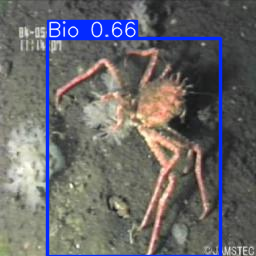


image 1/1 /kaggle/working/test/images/bio0016_frame0000275_jpg.rf.452260b49eb3fedee406bf56c50a83ce.jpg: 640x640 1 Bio, 19.3ms
Speed: 3.7ms preprocess, 19.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


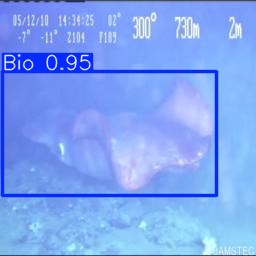


image 1/1 /kaggle/working/test/images/vid_000255_frame0000077_jpg.rf.4e33a4177520a51fe9cfa2c4fa6431a8.jpg: 640x640 1 Bio, 18.4ms
Speed: 3.3ms preprocess, 18.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


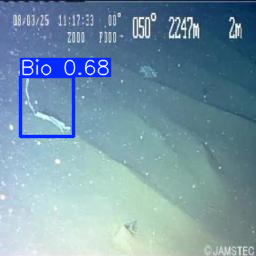

In [24]:
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')
import os


images = os.listdir("/kaggle/working/test/images/")
for i in range(120):
    image = os.path.join("/kaggle/working/test/images/", images[i])
    result_predict = Valid_model.predict(source = image, imgsz=(640), iou=0.4)

    # show results
    plot = result_predict[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(plot))